In [3]:
import os
import json
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
from natsort import natsorted

In [4]:
# Define paths
data_dir = os.path.expanduser("~/Documents/Omdena/FrankfurtGermanyChapter_UrbanGreenSpaceMappping/MULC")

# Classes for segmentation
# 12 : Impervious surfaces and buildings
# 3: Low vegetation
# 4: Trees
# 5: Water
# 6: Clutter/Background
class_names = ["impervious", "low_veg", "tree", "water", "background"]

In [5]:
def compute_class_ratios(mask):
    """Function to compute class ratios for each class"""
    ratios = {class_name: np.mean(mask[i]) for i, class_name in enumerate(class_names)}
    return ratios

def classify_urban_environment(ratios):
    """Urban environment classification thresholds"""
    if ratios['impervious'] > 0.7:
        return 'Dense Urban'
    elif 0.3 < ratios['impervious'] <= 0.7 and (ratios['tree'] > 0.1 or ratios['low_veg'] > 0.1):
        return 'Suburban'
    elif ratios['water'] > 0.3:
        return 'River and Riverside'
    elif ratios['tree'] > 0.6:
        return 'Forest'
    elif ratios['low_veg'] > 0.3 or ratios['tree'] > 0.3 or ratios['impervious'] < 0.2:
        return 'Outskirts/Agriculture'
    else:
        return 'Unknown'

def normalize_by_layer(image_array):
    """
    Function to normalize image data to the same max(1) and min(0)
    Since different layers(bands) have different scales, normalization will be done layer by layer
    """
    # Normalize by band
    image_array = image_array.astype(np.float64)  # Convert dtype of image file from int to float64

    for i in range(image_array.shape[2]):
        layer_min = np.min(image_array[:, :, i])
        layer_max = np.max(image_array[:, :, i])

        try:
            image_array[:, :, i] = (image_array[:, :, i] - layer_min) / (layer_max - layer_min)
        except ZeroDivisionError:
            print(f"Band {i} has zero variation (min = max = {layer_min}). Skipping normalization.")
            image_array[:, :, i] = 0  # Set the band to default value 0

    return image_array

def plot_samples(df, num_samples=5):
    """ Plot random images with their masks and computed values """
    samples = df.sample(num_samples, random_state=42)

    for _, row in samples.iterrows():
        with rasterio.open(row["image_path"]) as src_img, rasterio.open(row["mask_path"]) as src_mask:
            image_array = src_img.read().transpose(1, 2, 0)
            mask_array = src_mask.read().transpose(1, 2, 0)

        image_array = image_array[:, :, (1, 2, 3)]          # get the bands you want; (1, 2, 3) is RGB bands
        image_array = normalize_by_layer(image_array)       # Normalize the image by band
        mask_array = np.argmax(mask_array, axis=2, keepdims=True) + 2  # Convert fractional mask to binary mask

        # Define class colors
        class_colors = {
            2: "#808080",  # Gray
            3: "#ADFF2F",  # Light Green
            4: "#006400",  # Dark Green
            5: "#1E90FF",  # Blue
            6: "#8B4513",  # Brown
        }

        cmap = plt.cm.colors.ListedColormap([class_colors[c] for c in sorted(class_colors)])
        norm = plt.cm.colors.BoundaryNorm(boundaries=[1.5, 2.5, 3.5, 4.5, 5.5, 6.5], ncolors=5)  # Use a discrete colormap
        
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(image_array)
        axes[0].set_title(f"Image: {row['image_file']} ({row['urban_type']})")

        axes[1].imshow(mask_array, cmap=cmap, norm=norm)
        axes[1].set_title(f"Mask: {row['urban_type']}")

        plt.figtext(0.5, 0.01, f"Ratios: {row[class_names].to_dict()}", ha="center")
        plt.show()


In [6]:
def compute_dataset_summary(image_dir):
    image_dir_data = []
    mask_dir = image_dir + '_masks'
    image_files = [f for f in os.listdir(os.path.join(data_dir, image_dir)) if f.endswith('GeoTIFF.tif')]
    image_files = natsorted(image_files)

    for image_file in image_files:
        mask_file = image_file.replace('.tif', '_fractional_mask.tif')
        image_path = os.path.join(data_dir, image_dir, image_file)
        mask_path = os.path.join(data_dir, mask_dir, mask_file)

        with rasterio.open(image_path) as img:
            image = img.read()
        with rasterio.open(mask_path) as msk:
            mask = msk.read()

        # Compute class ratios, spectral indices, and urban environment type
        ratios = compute_class_ratios(mask)
        urban_type = classify_urban_environment(ratios)

        image_dir_data.append({
            "image_file": image_file,
            "mask_file": mask_file,
            "image_path": image_path,
            "mask_path": mask_path,
            **ratios,
            "urban_type": urban_type
        })

    df = pd.DataFrame(image_dir_data)
    plot_samples(df)  # Inspect samples
    df.to_csv('dataset_overview_{}.csv'.format(image_dir), index=False)
    print("Dataset summary saved to dataset_overview_{}.csv. Total images: {}"
          .format(image_dir, len(df)))


In [7]:
def show_combined_dataset_statistics(image_dirs):
    # Define the order for urban_type
    urban_type_order = ["Urban", "Suburban", "Forest", "Outskirts/Agriculture", "River and Riverside"]

    # Load all datasets and add dataset labels
    dfs = []
    for image_dir in image_dirs:
        df = pd.read_csv(f'dataset_overview_{image_dir}.csv')
        df["dataset"] = image_dir  # Label each dataset
        # df["urban_type"] = df["urban_type"].fillna("unknown")  # Handle missing values
        dfs.append(df)

        # Print summary statistics for each dataset
        print(f"\nDataset Statistics for {image_dir}:")
        print(df.describe())

        # Print urban type distribution
        print("\nUrban Type Distribution:")
        print(df["urban_type"].value_counts())

    # Combine all datasets
    combined_df = pd.concat(dfs, ignore_index=True)

    # Side-by-side box plot for class ratios
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=combined_df.melt(id_vars=["dataset"], value_vars=class_names),
                x="variable", y="value", hue="dataset", palette="Set2", showfliers=True)  # Ensure outliers are shown
    plt.xticks(rotation=45)
    plt.title("Boxplot of Class Ratios Across Datasets")
    plt.legend(title="Class", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.savefig('class_ratio_boxplot2.png', dpi=150)
    # plt.show()

    # Violin plots grouped by each class
    for class_name in class_names:
        plt.figure(figsize=(10, 5))
        sns.violinplot(data=combined_df, x="dataset", y=class_name, palette="Set2", inner="box")
        plt.xticks(rotation=45)
        plt.title(f"Violin Plot of {class_name} Ratios Across Datasets")
        plt.xlabel("Dataset")
        plt.ylabel("Class Ratio")
        plt.savefig(f'{class_name}_violin_plot.png', dpi=150)
        # plt.show()

    # Side-by-side bar plot for urban environment type distribution
    plt.figure(figsize=(10, 5))
    sns.countplot(data=combined_df, x="urban_type", hue="dataset",
                  order=urban_type_order, palette="tab10")
    plt.xticks(rotation=45)
    plt.title("Urban Environment Type Distribution Across Datasets")
    plt.xlabel("Urban Type")
    plt.ylabel("Count")
    plt.legend(title="Dataset", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    # Histogram of class ratio distribution (with custom y-axis scales)
    num_classes = len(class_names)
    fig, axes = plt.subplots(num_classes, len(image_dirs), figsize=(15, 10), sharex=True)

    for i, class_col in enumerate(class_names):  # Each row = 1 class
        for j, image_dir in enumerate(image_dirs):  # Each column = 1 dataset
            df_subset = combined_df[combined_df["dataset"] == image_dir]
            
            sns.histplot(df_subset[class_col], bins=20, kde=True, ax=axes[i, j], alpha=0.7)
            
            # Adjust y-axis scale
            # if class_col in ["water", "background"]:  
            #     axes[i, j].set_yscale("log")  # Use log scale for these classes
            #else:
            #    axes[i, j].set_yscale("linear")  # Use linear scale for others
            
            axes[i, j].set_title(f"{image_dir}" if i == 0 else "")  # Set dataset name at the top
            if j == 0:
                axes[i, j].set_ylabel(class_col)  # Set class name on the left
    
    plt.suptitle("Class Ratio Distribution Across Datasets", fontsize=14)
    plt.tight_layout()
    plt.show()



Dataset Statistics for SLMO_8R_1:
       impervious     low_veg        tree       water  background
count  682.000000  682.000000  682.000000  682.000000  682.000000
mean     0.258336    0.278011    0.405350    0.044849    0.013453
std      0.150077    0.162273    0.204149    0.098427    0.023010
min      0.000000    0.004587    0.011890    0.000000    0.000000
25%      0.134584    0.192128    0.276897    0.002496    0.001776
50%      0.274149    0.244735    0.385374    0.006870    0.005168
75%      0.364519    0.325935    0.500419    0.023720    0.013542
max      0.720912    0.976189    0.990529    0.545404    0.161356

Urban Type Distribution:
urban_type
Outskirts/Agriculture    279
Suburban                 230
Forest                    78
Urban                     62
River and Riverside       33
Name: count, dtype: int64

Dataset Statistics for SLMO_9R_2:
       impervious     low_veg        tree       water  background
count  813.000000  813.000000  813.000000  813.000000  813.000

/var/folders/ph/tzyyhxfj3jj6jltsdp2_ym6r0000gn/T/ipykernel_94930/2282610832.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=combined_df, x="dataset", y=class_name, palette="Set2", inner="box")
/var/folders/ph/tzyyhxfj3jj6jltsdp2_ym6r0000gn/T/ipykernel_94930/2282610832.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=combined_df, x="dataset", y=class_name, palette="Set2", inner="box")
/var/folders/ph/tzyyhxfj3jj6jltsdp2_ym6r0000gn/T/ipykernel_94930/2282610832.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(dat

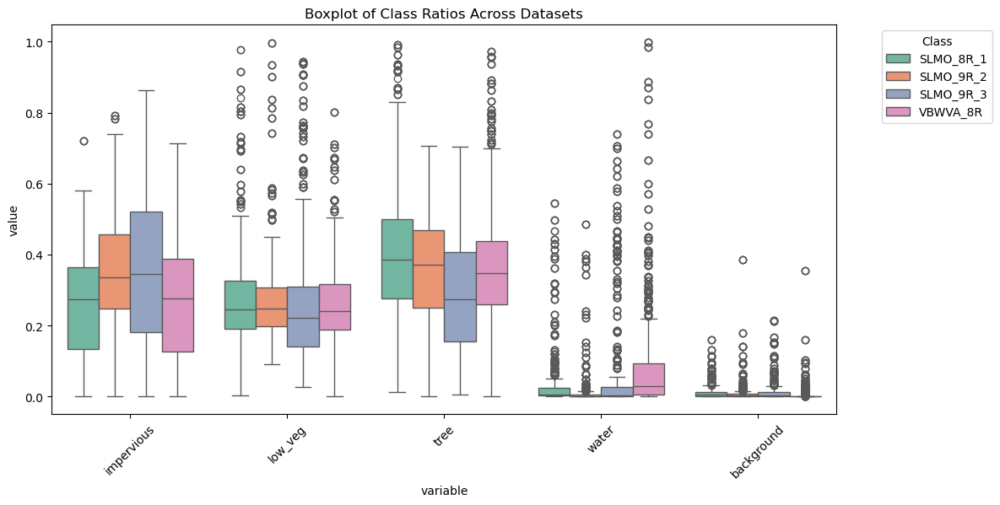

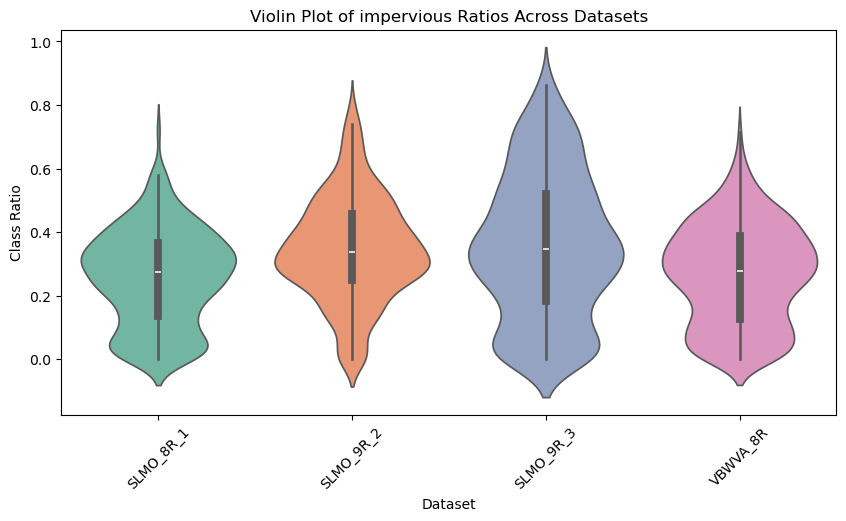

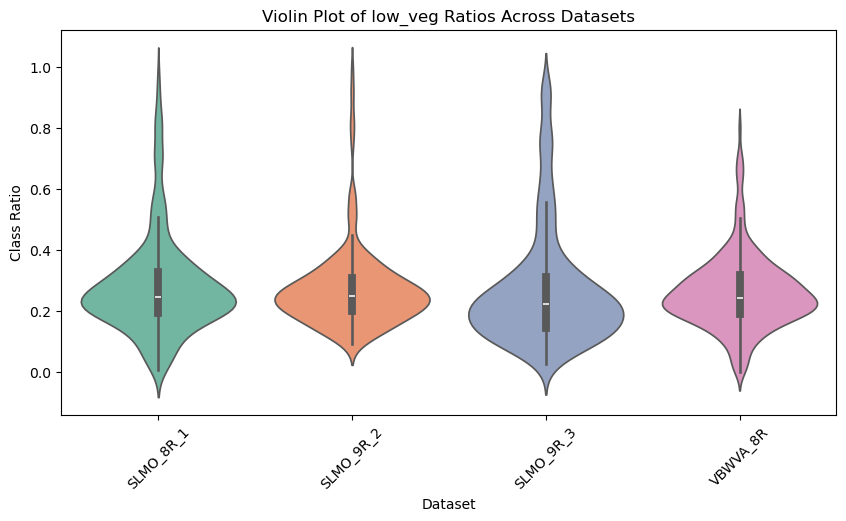

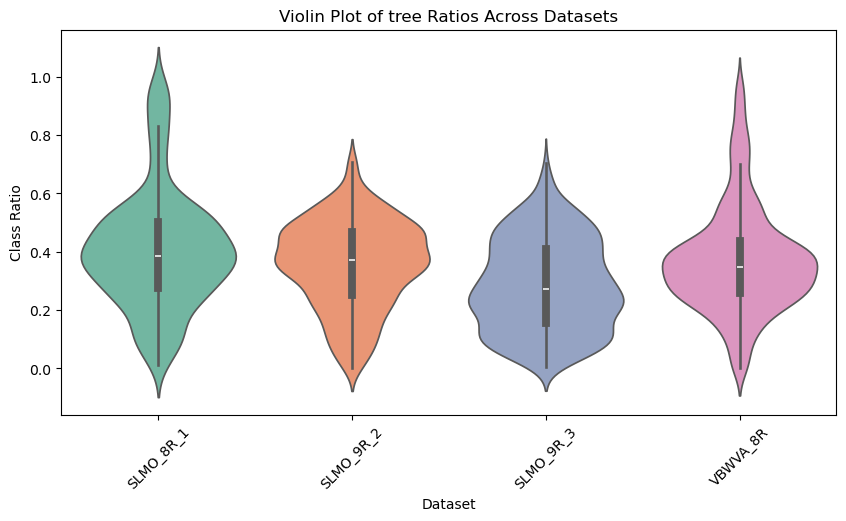

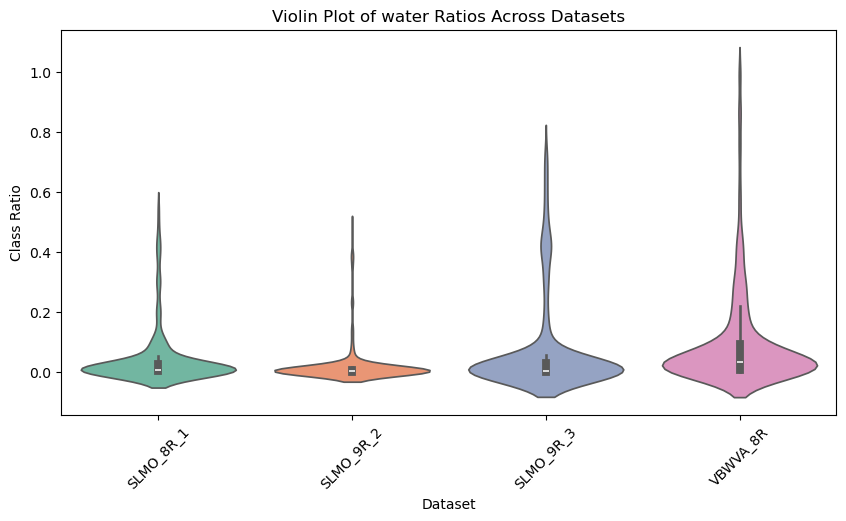

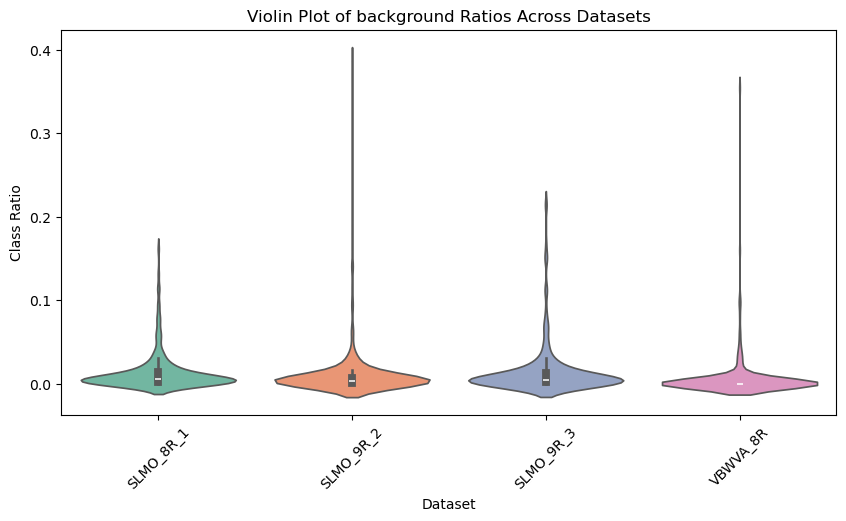

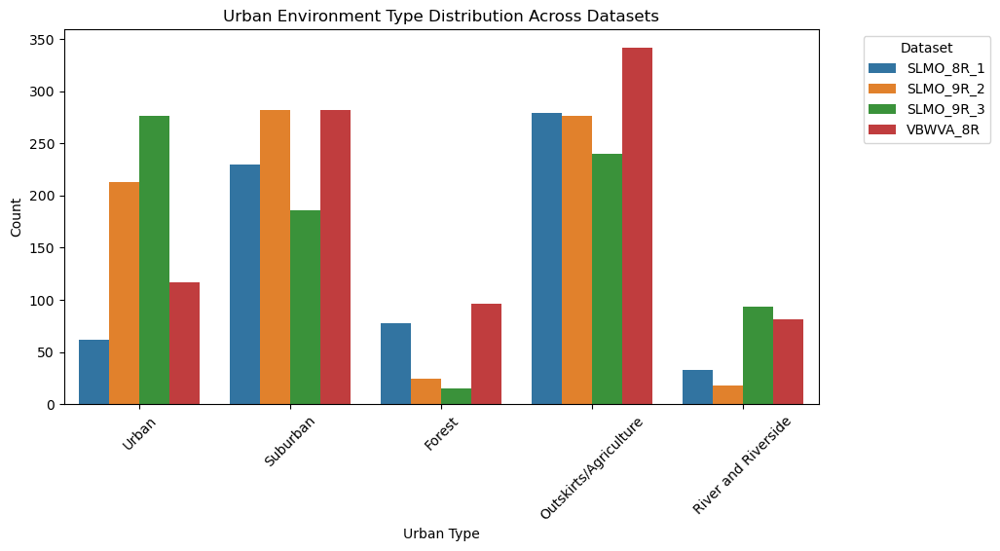

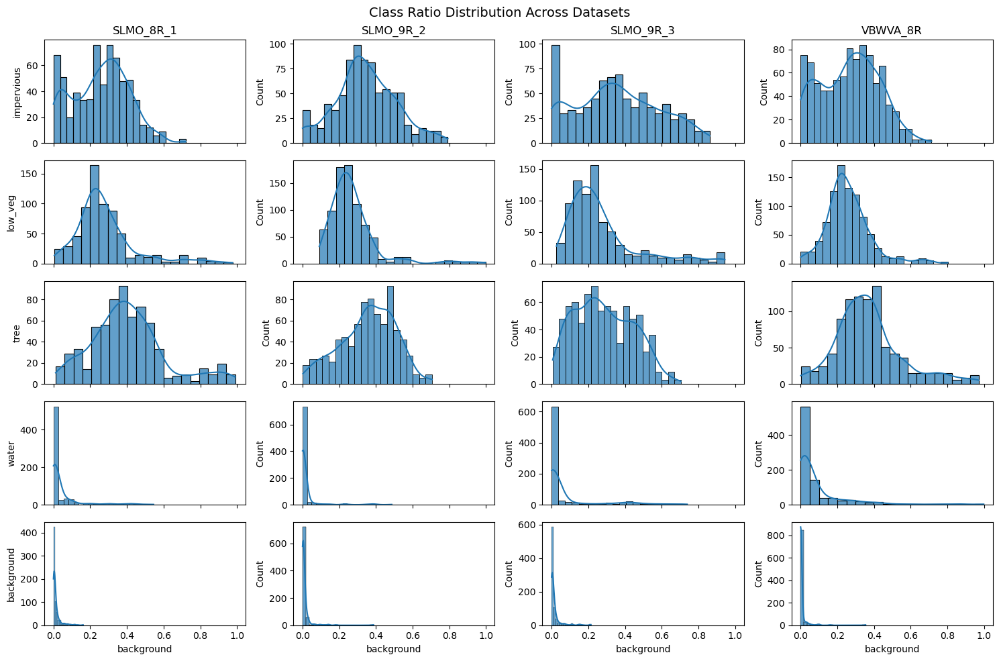

In [8]:
# Load dataset and compute statistics for each dataset
image_dirs = sorted([d.replace('_masks', '') for d in os.listdir(data_dir) if d.endswith('_masks')])

for image_dir in image_dirs:
    if not os.path.exists(os.path.join(os.getcwd(), 'dataset_overview_{}.csv'.format(image_dir))):
        compute_dataset_summary(image_dir)

show_combined_dataset_statistics(image_dirs)

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from IPython.display import display, HTML
import base64
from io import BytesIO
import rasterio
import re

# Define color mapping for mask visualization
class_colors = {
    2: "#808080",  # Gray (impervious)
    3: "#ADFF2F",  # Light Green (low vegetation)
    4: "#006400",  # Dark Green (trees)
    5: "#1E90FF",  # Blue (water)
    6: "#8B4513",  # Brown (clutter)
}

# Function to normalize and process images
def process_image(image_path):
    with rasterio.open(image_path) as img:
        image = img.read()
    image = np.transpose(image, [1, 2, 0])  # Move bands to last axis
    image[np.isnan(image)] = 0  # Replace NaN with 0
    image = image[:, :, (1, 2, 3)]  # Select RGB bands (assuming BGR order)
    image = (image - image.min()) / (image.max() - image.min() + 1e-6)  # Normalize
    return image

# Function to process and colorize the mask
def process_mask(mask_path):
    with rasterio.open(mask_path) as msk:
        mask = msk.read()
    mask = np.transpose(mask, [1, 2, 0])  # Move bands to last axis
    mask[np.isnan(mask)] = 0  # Replace NaN with 0
    mask = np.argmax(mask, axis=2, keepdims=True) + 2  # Convert to class indices
    return mask

# Function to convert a plotted image/mask to base64 for inline display
def image_to_base64(image, is_mask=False):
    fig, ax = plt.subplots(figsize=(2, 2))
    if is_mask:
        cmap = plt.cm.colors.ListedColormap([class_colors[c] for c in sorted(class_colors)])
        norm = plt.cm.colors.BoundaryNorm(boundaries=[1.5, 2.5, 3.5, 4.5, 5.5, 6.5], ncolors=5)  # Use a discrete colormap
        ax.imshow(image[:, :, 0], cmap=cmap, norm=norm)  # Only first channel
    else:
        ax.imshow(image)

    ax.axis("off")
    buf = BytesIO()
    fig.savefig(buf, format="png", bbox_inches="tight", pad_inches=0)
    plt.close(fig)
    return f'<img src="data:image/png;base64,{base64.b64encode(buf.getvalue()).decode()}" width="256"/>'


,image_file,impervious,low_veg,tree,water,background,urban_type,Processed Image,Processed Mask
0,SLMO1_2016_0_2_GeoTIFF.tif,0.034627,0.117242,0.799293,0.044978,0.003860,Forest,,
1,SLMO1_2016_0_3_GeoTIFF.tif,0.034627,0.117242,0.799293,0.044978,0.003860,Forest,,
2,SLMO1_2016_1_2_GeoTIFF.tif,0.081024,0.532299,0.335623,0.015271,0.035782,Outskirts/Agriculture,,
3,SLMO1_2016_1_3_GeoTIFF.tif,0.081024,0.532299,0.335623,0.015271,0.035782,Outskirts/Agriculture,,
4,SLMO1_2016_2_1_GeoTIFF.tif,0.016979,0.169174,0.739475,0.069774,0.004598,Forest,,
5,SLMO1_2016_2_2_GeoTIFF.tif,0.016979,0.169174,0.739475,0.069774,0.004598,Forest,,
6,SLMO1_2016_3_3_GeoTIFF.tif,0.035797,0.064365,0.896703,0.000255,0.002879,Forest,,
7,SLMO1_2016_4_3_GeoTIFF.tif,0.035299,0.156443,0.795317,0.001984,0.010956,Forest,,
8,SLMO1_2016_5_3_GeoTIFF.tif,0.231147,0.196670,0.562658,0.005587,0.003937,Outskirts/Agriculture,,
9,SLMO1_2016_6_3_GeoTIFF.tif,0.352868,0.209073,0.413293,0.004207,0.020558,Suburban,,

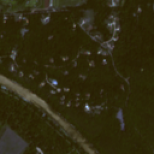
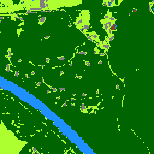
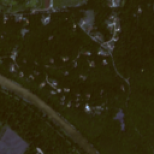
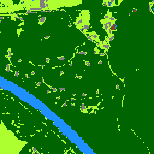
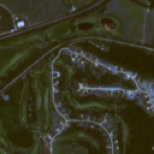
...
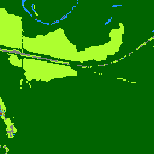
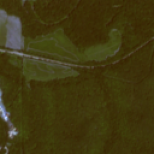
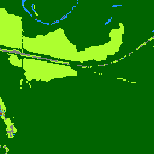
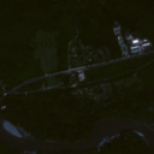
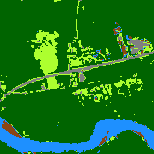

,image_file,impervious,low_veg,tree,water,background,urban_type,Processed Image,Processed Mask
0,SLMO2_2016_0_1_GeoTIFF.tif,0.311351,0.220820,0.440421,0.008857,0.018550,Suburban,,
1,SLMO2_2016_0_2_GeoTIFF.tif,0.311351,0.220820,0.440421,0.008857,0.018550,Suburban,,
2,SLMO2_2016_0_3_GeoTIFF.tif,0.311351,0.220820,0.440421,0.008857,0.018550,Suburban,,
3,SLMO2_2016_1_1_GeoTIFF.tif,0.236529,0.248427,0.120727,0.007624,0.386694,Outskirts/Agriculture,,
4,SLMO2_2016_1_2_GeoTIFF.tif,0.236529,0.248427,0.120727,0.007624,0.386694,Outskirts/Agriculture,,
5,SLMO2_2016_1_3_GeoTIFF.tif,0.236529,0.248427,0.120727,0.007624,0.386694,Outskirts/Agriculture,,
6,SLMO2_2016_2_1_GeoTIFF.tif,0.405322,0.321747,0.151682,0.004899,0.116351,Suburban,,
7,SLMO2_2016_2_2_GeoTIFF.tif,0.405322,0.321747,0.151682,0.004899,0.116351,Suburban,,
8,SLMO2_2016_2_3_GeoTIFF.tif,0.405322,0.321747,0.151682,0.004899,0.116351,Suburban,,
9,SLMO2_2016_3_1_GeoTIFF.tif,0.523032,0.267900,0.114261,0.089122,0.005686,Urban,,

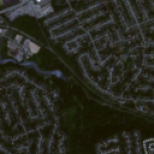
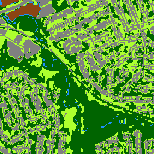
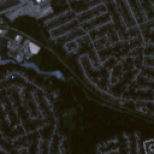
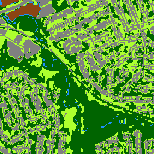
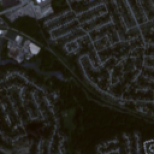
...
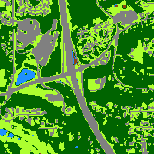
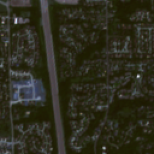
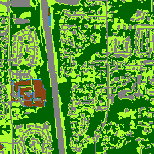
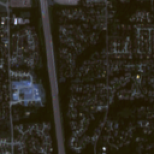
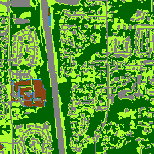

,image_file,impervious,low_veg,tree,water,background,urban_type,Processed Image,Processed Mask
0,SLMO3_2016_0_1_GeoTIFF.tif,0.458638,0.135358,0.405230,0.000000,0.000775,Urban,,
1,SLMO3_2016_0_2_GeoTIFF.tif,0.458638,0.135358,0.405230,0.000000,0.000775,Urban,,
2,SLMO3_2016_0_3_GeoTIFF.tif,0.458638,0.135358,0.405230,0.000000,0.000775,Urban,,
3,SLMO3_2016_1_1_GeoTIFF.tif,0.509927,0.140204,0.345467,0.001067,0.003335,Urban,,
4,SLMO3_2016_1_2_GeoTIFF.tif,0.509927,0.140204,0.345467,0.001067,0.003335,Urban,,
5,SLMO3_2016_1_3_GeoTIFF.tif,0.509927,0.140204,0.345467,0.001067,0.003335,Urban,,
6,SLMO3_2016_2_1_GeoTIFF.tif,0.452332,0.148899,0.392895,0.000481,0.005393,Urban,,
7,SLMO3_2016_2_2_GeoTIFF.tif,0.452332,0.148899,0.392895,0.000481,0.005393,Urban,,
8,SLMO3_2016_2_3_GeoTIFF.tif,0.452332,0.148899,0.392895,0.000481,0.005393,Urban,,
9,SLMO3_2016_3_1_GeoTIFF.tif,0.485281,0.101216,0.408757,0.000980,0.003766,Urban,,

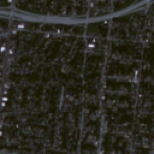
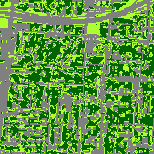
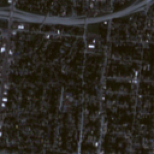
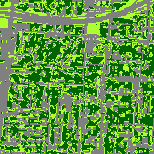
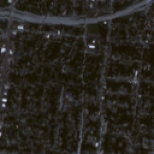
...
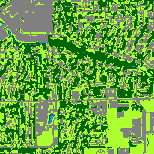
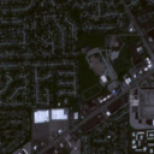
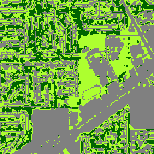
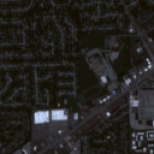
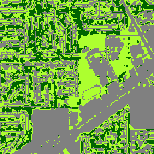

,image_file,impervious,low_veg,tree,water,background,urban_type,Processed Image,Processed Mask
0,VBWVA_2016_0_1_GeoTIFF.tif,0.075795,0.672706,0.228586,0.022913,0.000000,Outskirts/Agriculture,,
1,VBWVA_2016_0_2_GeoTIFF.tif,0.075795,0.672706,0.228586,0.022913,0.000000,Outskirts/Agriculture,,
2,VBWVA_2016_0_3_GeoTIFF.tif,0.075795,0.672706,0.228586,0.022913,0.000000,Outskirts/Agriculture,,
3,VBWVA_2016_1_1_GeoTIFF.tif,0.208900,0.285682,0.482698,0.022720,0.000000,Outskirts/Agriculture,,
4,VBWVA_2016_1_2_GeoTIFF.tif,0.208900,0.285682,0.482698,0.022720,0.000000,Outskirts/Agriculture,,
5,VBWVA_2016_1_3_GeoTIFF.tif,0.208900,0.285682,0.482698,0.022720,0.000000,Outskirts/Agriculture,,
6,VBWVA_2016_2_1_GeoTIFF.tif,0.218247,0.307808,0.409185,0.064760,0.000000,Outskirts/Agriculture,,
7,VBWVA_2016_2_2_GeoTIFF.tif,0.218247,0.307808,0.409185,0.064760,0.000000,Outskirts/Agriculture,,
8,VBWVA_2016_2_3_GeoTIFF.tif,0.218247,0.307808,0.409185,0.064760,0.000000,Outskirts/Agriculture,,
9,VBWVA_2016_3_1_GeoTIFF.tif,0.154581,0.232249,0.557075,0.056096,0.000000,Outskirts/Agriculture,,

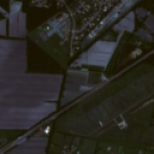
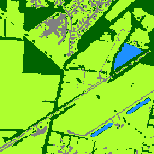
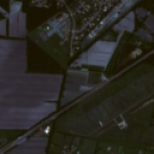
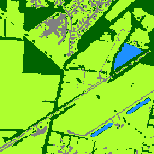
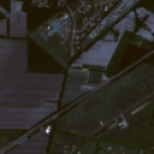
...
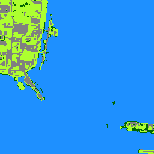
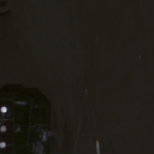
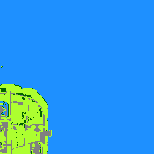
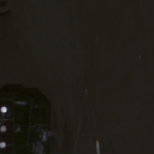
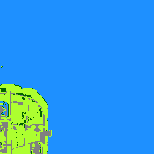

In [105]:
# Load dataset and compute statistics for each dataset
image_dirs = sorted([d.replace('_masks', '') for d in os.listdir(data_dir) if d.endswith('_masks')])

for image_dir in image_dirs:
    df = pd.read_csv('dataset_overview_{}.csv'.format(image_dir))
    
    # For faster sample display, comment out this line to display the whole dataset
    df = df[:50]  
    
    # Process images and masks
    df["Processed Image"] = df["image_path"].apply(lambda x: image_to_base64(process_image(x)))
    df["Processed Mask"] = df["mask_path"].apply(lambda x: image_to_base64(process_mask(x), is_mask=True))
    
    # Drop paths for cleaner display
    df_display = df.drop(columns=["mask_file", "image_path", "mask_path"])
    
    # Convert DataFrame to HTML with inline images
    html_table = df_display.to_html(escape=False)

    # Display in a new cell
    display(HTML(f"<h2>Dataset: {image_dir}</h2>"))
    display(HTML(html_table))